# Boston Housing data analysis using *K Means Clustering*

Source:<br> 
https://raw.githubusercontent.com/jbrownlee/Datasets/master/housing.data <br><br>

In [32]:
# Base libraries
import numpy as np
import scipy as sp

# Visualization libraries
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import style

# Algorithm testing libraries
from sklearn.cluster import KMeans

# Additional libraries for testing
import random 
import os

# Suppress scientific notation in Pandas, Numpy
pd.set_option('display.float_format', lambda x: '%.5f' % x)
np.set_printoptions(precision=5, suppress=True)

In [33]:
url = 'https://raw.githubusercontent.com/jbrownlee/Datasets/master/housing.data'

# Legend for the data
header_dict = {
    'CRIM': 'per capita crime rate by town', 
    'ZN': 'proportion of residential land zoned for lots over 25,000 sq.ft',
    'INDUS': 'proportion of nonretail business acres per town',
    'CHAS': 'Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)' ,
    'NOX': 'nitric oxides concentration (parts per 10 million)', 
    'RM': 'average number of rooms per dwelling', 
    'AGE': 'proportion of owner-occupied units built prior to 1940' , 
    'DIS': 'weighted distances to five Boston employment centers', 
    'RAD': 'index of accessibility to radial highways' , 
    'TAX': 'full-value property-tax rate per $10,000' , 
    'PTRATIO': 'pupil-teacher ratio by town', 
    'B': '1000(Bk – 0.63)^2 where Bk is the proportion of blacks by town', 
    'LSTAT': 'percent lower status of the population', 
    'MEDV': 'Median value of owner-occupied homes in $1000s'
    }

# Column headers 
headers = [
    'CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 
    'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV'
    ]

# Creating dataset 
df = pd.read_fwf(url, names=headers)

In [34]:
print(f'Rows: {len(df)}')
print(f'Columns: {len(df.columns)}')
df.head()

Rows: 506
Columns: 14


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.00000,2.31000,0,0.53800,6.57500,65.20000,4.09000,1,296.00000,15.30000,396.90000,4.98000,24.00000
1,0.02731,0.00000,7.07000,0,0.46900,6.42100,78.90000,4.96710,2,242.00000,17.80000,396.90000,9.14000,21.60000
2,0.02729,0.00000,7.07000,0,0.46900,7.18500,61.10000,4.96710,2,242.00000,17.80000,392.83000,4.03000,34.70000
3,0.03237,0.00000,2.18000,0,0.45800,6.99800,45.80000,6.06220,3,222.00000,18.70000,394.63000,2.94000,33.40000
4,0.06905,0.00000,2.18000,0,0.45800,7.14700,54.20000,6.06220,3,222.00000,18.70000,396.90000,5.33000,36.20000


In [35]:
# There are no null values in the dataset
df.isna().sum()

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
MEDV       0
dtype: int64

CRIM


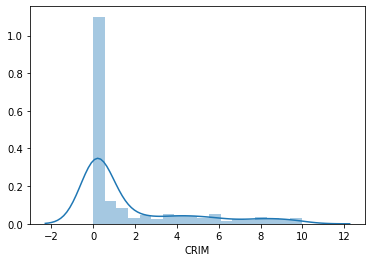

ZN


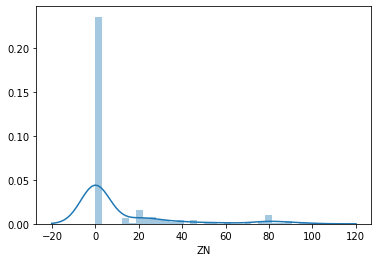

INDUS


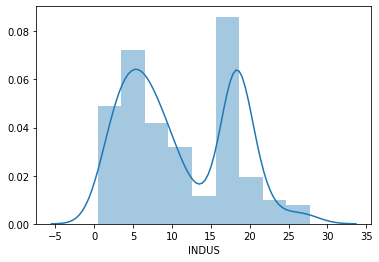

CHAS


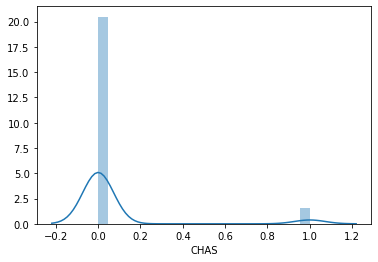

NOX


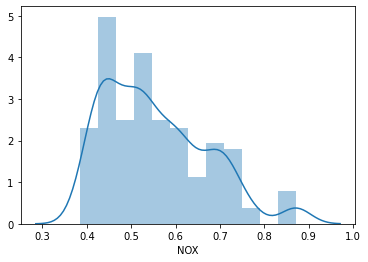

RM


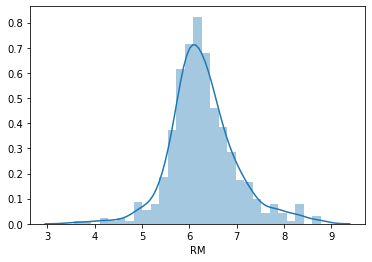

AGE


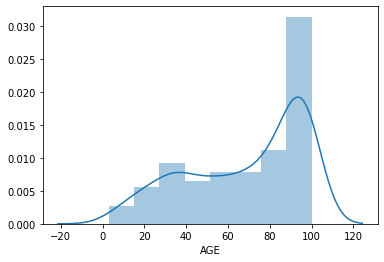

DIS


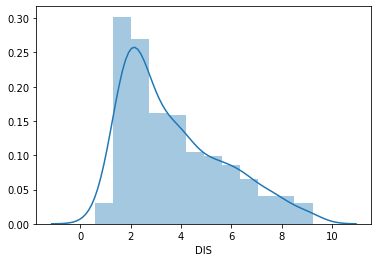

RAD


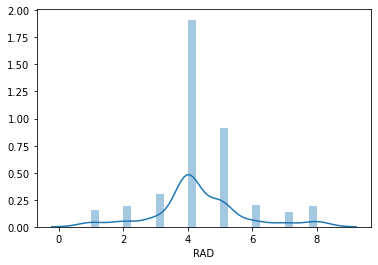

TAX


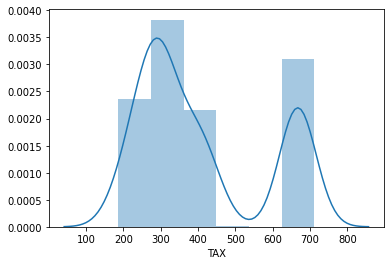

PTRATIO


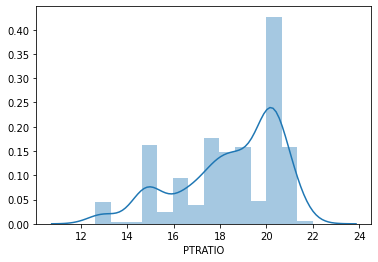

B


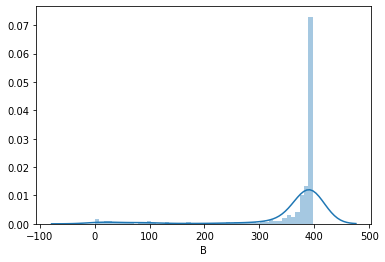

LSTAT


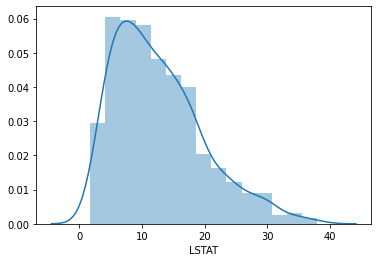

MEDV


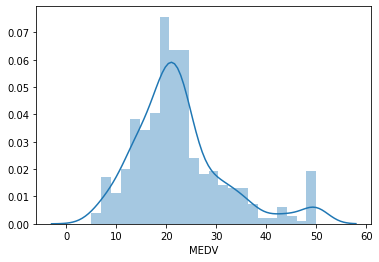

In [36]:
# Histogram of each value to get a quick glance of distribution
for stat in df.columns:
    print(stat)
    sns.distplot(df[stat])
    plt.show()

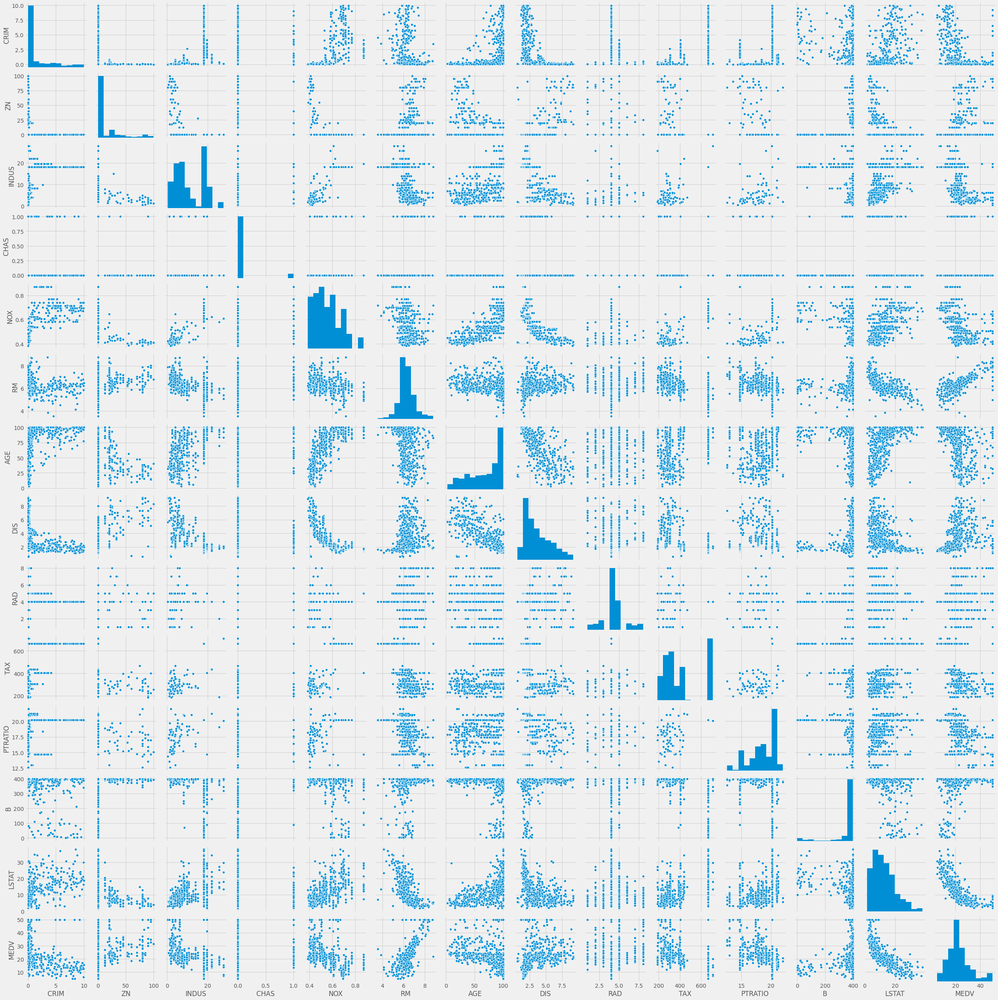

In [54]:
sns.pairplot(df)

## K Means Clustering


In [37]:
# Create a dataframe with Crime and Pupil-Teacher ratios
pt_crim = df[['PTRATIO', 'LSTAT']]
pt_crim.head()

,PTRATIO,LSTAT
0,15.30000,4.98000
1,17.80000,9.14000
2,17.80000,4.03000
3,18.70000,2.94000
4,18.70000,5.33000


In [38]:
# Create an array with above attributes 
pt_c_array = np.array(pt_crim)
pt_c_array

array([[15.3 ,  4.98],
       [17.8 ,  9.14],
       [17.8 ,  4.03],
       ...,
       [21.  ,  5.64],
       [21.  ,  6.48],
       [21.  ,  7.88]])

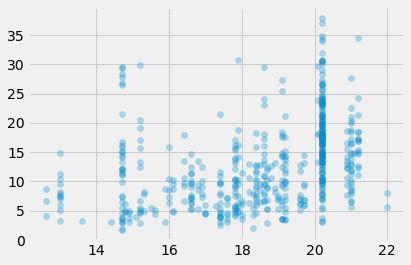

In [39]:
style.use('fivethirtyeight')
plt.scatter(pt_c_array[:, 0], pt_c_array[:, 1], alpha=0.3)
plt.show()

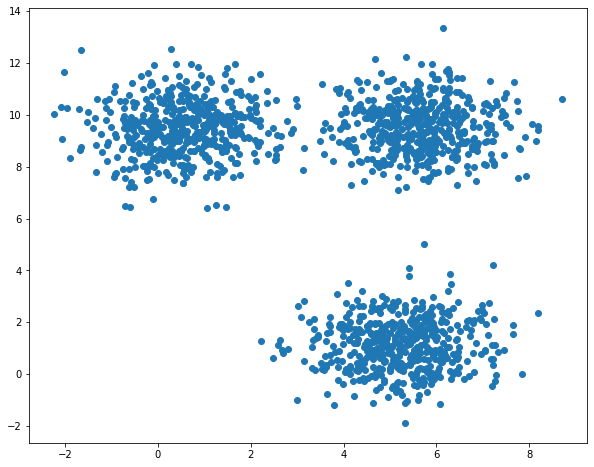

In [24]:
# Generate population for k_means algorithm testing
number_of_centres=3
number_of_points_per_centre=500
np.random.seed(42)
colors = ['red', 'blue' , 'green', 'orange', 'blue', 'gray']
img_counter = 0
for i in range(number_of_centres): 
    means = [15 * np.random.random(), 10 * np.random.random()]
    a = np.random.multivariate_normal(means, [[1,0], [0,1]], number_of_points_per_centre)    
    if i == 0:
        X = a
    else:    
        X = np.vstack((X, a))
plt.figure(figsize = (10, 8))
plt.scatter(X[:,0], X[:,1]);

In [27]:
X

array([[ 6.26579032, 11.03017292],
       [ 5.38394841,  9.27300611],
       [ 7.1973146 , 10.27457779],
       ...,
       [ 5.56648443,  0.95472194],
       [ 3.32450045,  0.24959598],
       [ 4.81870248,  2.99766865]])

In [30]:
def recalculate_clusters(X, centroids, k):
    """ Recalculates the clusters """
    clusters=dict()
    for i in range(k):
        clusters[i] = []
    for data in X:
        e_distance = []
        for j in range(k):
            e_distance.append(np.linalg.norm(data - centroids[j]))
        clusters[e_distance.index(min(e_distance))].append(data)
    return clusters    
 
def recalculate_centroids(centroids, clusters, k):
    """ Recalculates the centroid position based on the plot """ 
    for i in range(k):
        centroids[i] = np.average(clusters[i], axis=0)
    return centroids

def plot_clusters(centroids, clusters, k):
    """ Plots the clusters with centroid """ 
    plt.figure(figsize = (10, 8))  
    area = (20) ** 2
    for i in range(k):
        for cluster in clusters[i]:
            plt.scatter(cluster[0], cluster[1], c=colors[i % k])          
        plt.scatter(centroids[i][0], centroids[i][1], s=area, marker='^', edgecolors='white', c=colors[i % k])

def k_means_clustering(X, centroids={}, k=3, repeats=10):
    """ Calculates full k_means_clustering algorithm """
    for i in range(k):
        centroids[i] = X[i]

    for i in range(repeats):        
        clusters = recalculate_clusters(X, centroids, k)  
        centroids = recalculate_centroids(centroids, clusters, k)
        return plot_clusters(centroids, clusters, k)

In [31]:
k_means_clustering(pt_c_array)

NameError: name 'pt_c_array' is not defined